---
# Create graphic for study area, Vessel Time Exposures (VTE) and comparing oil spills files
---

The monte carlo runs were completed on Compute Canada's supercomputer, `Graham` and this code is intended to be used on that system.  It requires initialization of a Virtual Environment.  See `/home/rmueller/projects/def-allen/rmueller/graham-jupyter-env.txt`.

First initiate a compute node (no heavy-lifting in this example) with: 
```
salloc --time=1:00:00 --ntasks=1 --cpus-per-task=1 --mem-per-cpu=1024M --account=rrg-allen
```
Activate `VENV` with:
```
module load python/3.8.2
source ~/venvs/jupyter/bin/activate
```
Deactivate `VENV` with:
```
deactivate
```
If the `jupyter` `VENV` is not yet setup, install it with:
```
module load python/3.8.2
python3 -m virtualenv --no-download ~/venvs/jupyter
source ~/venvs/jupyter/bin/activate
python3 -m pip install --no-index --upgrade pip
python3 -m pip install -r /home/rmueller/projects/def-allen/rmueller/graham-jupyter-env.txt
```

This environment is setup to allow user to initiate a remote window using:
```
jupyter lab --no-browser --ip $(hostname -f)
```

In [1]:
import os
import numpy
import pandas
import xarray
import netCDF4 as nc
import cartopy.crs
import cmocean
import rioxarray
from array import *
from cmocean import cm as cmo
from glob import glob
from cartopy import crs,feature
import matplotlib as mpl
from matplotlib import pyplot as plt, patches, colors
from mpl_toolkits.axes_grid1 import make_axes_locatable
from pathlib import Path
# used to make subplot labels consistent between figures
from matplotlib.offsetbox import AnchoredText
#from salishsea_tools import geo_tools, tidetools

In [2]:
graphics_dir = Path('/ocean/rmueller/MIDOSS/graphics/')
geotiff_directory = Path('/data/MIDOSS/geotiffs')
# larger, presentation-size graphics require different xy text specifications
graphics_size='large'
if graphics_size=='large':
    # graphics style
    plt.style.use(r"../../style_templates/meopar2022_matplotlibrc.template")
    #plt.style.use(r"../../style_templates/general_matplotlibrc.template")

# mapping specifications
rotated_crs = cartopy.crs.RotatedPole(pole_longitude=120.0, pole_latitude=63.75)
plain_crs = cartopy.crs.PlateCarree()
# linewidth for coast/rivers
lw=0.3
# reducd dpi to make smaller graphics
custom_dpi=600

In [3]:
mask = xarray.open_dataset('/data/bmoorema/MEOPAR/grid/mesh_mask201702.nc')
coords = xarray.open_dataset('/data/bmoorema/MEOPAR/grid/coordinates_seagrid_SalishSea201702.nc', decode_times=False)
bathy = xarray.open_dataset('/data/bmoorema/MEOPAR/grid/bathymetry_201702.nc')
spills = pandas.read_csv('/data/sallen/results/MIDOSS/Monte_Carlo/northern_strait.csv')

# Load ETOPO1 data set
topo = xarray.open_dataset('/ocean/bmoorema/research/MEOPAR/analysis-ben/data/ETOPO1_Bed_g_gmt4.grd')

# Crop to Salish Sea
extent = [-126.5, -121.2, 46.8, 51.2]
topo_salishsea = topo.sel(x=slice(*extent[:2]), y=slice(*extent[2:]))
lon, lat = [coords[var][0, ...].values for var in ('glamt', 'gphit')]
#lon, lat, depth = [topo_salishsea[var].values for var in ('x', 'y', 'z')]
tmask = mask.tmask[0, 0, ...].values

In [4]:
# Annotations
if graphics_size=='large':
    annotations_coarse = [
        {'name': 'Model Domain'        , 'xy': (0.43, 0.8), 'r':-60, 'wt': 'bold', 'arrow': None, 'ha':'left','alpha':0.4},
        {'name': 'Pacific\nOcean'      , 'xy': (0.100, 0.2), 'r':0, 'wt': 'bold', 'arrow': None, 'ha':'left','alpha':None},
        {'name': 'Puget\nSound'        , 'xy': (0.81, 0.2), 'r':0, 'wt': 'bold', 'arrow': None, 'ha':'left','alpha':None},
        {'name': 'Juan de Fuca\nStrait', 'xy': (0.45, 0.28), 'r': -20, 'wt': 'bold', 'arrow': None, 'ha':'center','alpha':None},
        {'name': 'Johnstone\nStrait'   , 'xy': (0.11, 0.717), 'r': -20, 'wt': 'bold', 'arrow': None, 'ha':'center','alpha':None},
        {'name': 'Fraser\nRiver'       , 'xy': (0.855, 0.470), 'r':   0, 'wt': 'bold', 'arrow': None, 'ha':'left','alpha':None},
        {'name': 'Strait of\nGeorgia'  , 'xy': (0.735, 0.585), 'r':   0, 'wt': 'bold', 'arrow': (0.665, 0.59,  -0.065,  -0.03), 'ha':'center','alpha':None},
    ]
    annotations_fine = [
        {'name': '1', 'xy': (0.622,0.25), 'r':0, 'wt': 'bold', 'arrow': None, 'ha':'left','alpha':0.6},
        {'name': '2', 'xy': (0.29,0.39), 'r':0, 'wt': 'bold', 'arrow': None, 'ha':'left','alpha':0.6},
        {'name': '3', 'xy': (0.477,0.43), 'r':0, 'wt': 'bold', 'arrow': None, 'ha':'left','alpha':0.6},
        {'name': '4', 'xy': (0.345,0.57), 'r':0, 'wt': 'bold', 'arrow': None, 'ha':'left','alpha':0.6},
        {'name': '5', 'xy': (0.75,0.445), 'r':0, 'wt': 'bold', 'arrow': None, 'ha':'left','alpha':0.6},
    ]
else:
    annotations_coarse = [
        {'name': 'Model Domain'        , 'xy': (0.41, 0.78), 'r':   -60, 'wt': 'bold', 'arrow': None, 'ha':'left','alpha':0.4},
        {'name': 'Pacific\nOcean'      , 'xy': (0.100, 0.200), 'r':   0, 'wt': 'bold', 'arrow': None, 'ha':'left','alpha':None},
        {'name': 'Puget\nSound'        , 'xy': (0.810, 0.180), 'r':   0, 'wt': 'bold', 'arrow': None, 'ha':'left','alpha':None},
        {'name': 'Juan de Fuca\nStrait', 'xy': (0.475, 0.26), 'r': -17, 'wt': 'bold', 'arrow': None, 'ha':'center','alpha':None},
        {'name': 'Johnstone\nStrait'   , 'xy': (0.11, 0.717), 'r': -20, 'wt': 'bold', 'arrow': None, 'ha':'center','alpha':None},
        {'name': 'Fraser\nRiver'       , 'xy': (0.855, 0.470), 'r':   0, 'wt': 'bold', 'arrow': None, 'ha':'left','alpha':None},
        {'name': 'Strait of\nGeorgia'  , 'xy': (0.75, 0.6), 'r':   0, 'wt': 'bold', 'arrow': (0.665, 0.59,  -0.065,  -0.03), 'ha':'center','alpha':None},
    ]

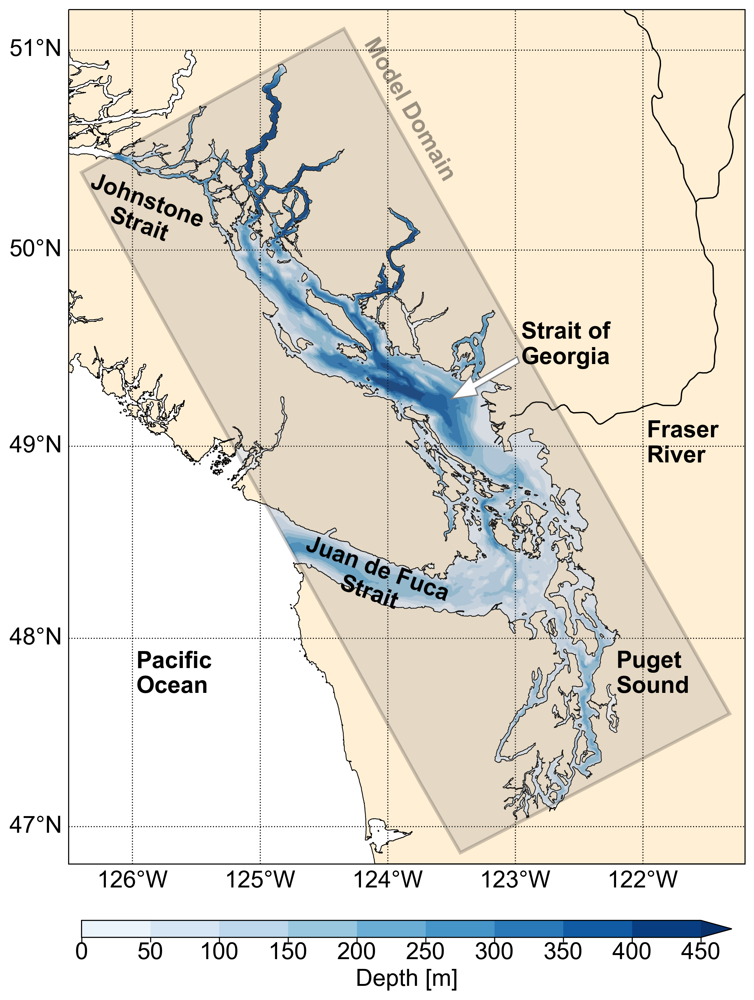

In [5]:
# The code for this figure is a modified version of code from Ben Moore-Maley
# --------- Figure setup ---------
proj_ref = crs.PlateCarree()
fig = plt.figure(figsize=(30, 12))
gs = plt.GridSpec(1, 3, wspace=0.05)

# --------- Left panel -----------
# Make map
extent = [-126.5, -121.2, 46.8, 51.2]
proj = crs.Mercator(numpy.mean(extent[:2]), *extent[2:])
ax = fig.add_subplot(gs[0], projection=proj)
ax.set_extent(extent)
ax.add_feature(feature.GSHHSFeature('full', edgecolor='k', linewidth=0.6, facecolor='papayawhip'))
ax.add_feature(feature.NaturalEarthFeature(
    category='physical', name='rivers_lake_centerlines',
    scale='10m', facecolor='none', edgecolor='k',
))
gl = ax.gridlines(linestyle=":", color='k', draw_labels=True)
gl.top_labels, gl.right_labels = False, False

# Overlay model domain
domain_box = numpy.array([(lon[ji], lat[ji]) for ji in [(0, 0), (0, -1), (-1, -1), (-1, 0)]])
c = ax.contourf(lon, lat, bathy.Bathymetry, levels=numpy.arange(0, 451, 50), cmap='Blues', extend='max', transform=proj_ref)
ax.add_patch(patches.Polygon(domain_box, ec='k', fc='gray', lw=2.5, alpha=0.2, transform=proj_ref, zorder=2))
#ax.add_patch(patches.Rectangle((-125.3, 49.1), 1.5, 1.2, fc='w', ec='k', alpha=0.5, lw=2.5, transform=proj_ref, zorder=2))

# Annotations
for ann in annotations_coarse:
    if ann['alpha'] is not None:
        ax.text(*ann['xy'], ann['name'], 
                transform=ax.transAxes, 
                rotation=ann['r'], 
                fontdict={'weight': ann['wt'], 'color': 'k'},
                ha=ann['ha'],
                alpha=ann['alpha']
               )
    else:
        ax.text(*ann['xy'], ann['name'], 
                transform=ax.transAxes, 
                rotation=ann['r'], 
                fontdict={'weight': ann['wt'], 'color': 'k'},
                ha=ann['ha']
               )
    if ann['arrow'] is not None:
        ax.arrow(*ann['arrow'], width=0.0075, head_width=0.025, edgecolor='grey', facecolor='white', transform=ax.transAxes, zorder=10)

# Colorbar
cax = fig.add_axes([0.135, 0.06, 0.23, 0.015])
fig.colorbar(c, cax=cax, orientation='horizontal', label='Depth [m]')

# save figure
if custom_dpi>=600:
    plt.savefig(graphics_dir/'SSC_model_domain.png')
else:
    plt.savefig(graphics_dir/'SSC_model_domain_small.png')
 

# First attempt for masked region 
## Based on lat/lon values

### Boundary boxes for regional analyses

In [6]:
domain_box

array([[-123.42943248,   46.85966577],
       [-121.31835518,   47.60092035],
       [-124.34198758,   51.10480224],
       [-126.40028872,   50.38992717]])

In [7]:
## Create masks
# order: (lower-left, lower-right, upper-right, upper-left)
jdf_box = numpy.array([
    [-125,48.079463],[-123.6,48.079463],
    [-123.6,48.7],[-125,48.7]
])
gulfIsland_box = numpy.array([
    [-123.661884,48.693059],[-123.044003,48.693059],[
    -123.044003,48.953784],[-123.661884,48.953784]
]) 
pugetSound_box = numpy.array([
    [-123.25,47],[-122,47],
    [-122,48.064543],[-123.25,48.064543]
])
cowichan_box = numpy.array([
    [-124,48.7],[-123,48.7],
    [-123,49.25],[-124,49.25]
])
lummi_box = numpy.array([
    [-122.72,48.64],[-122.54,48.64],
    [-122.54,48.8],[-122.72,48.8]
])
sog_box = numpy.array([
    [-124.7,49],[-122.6849,49],
    [-122.68,49.46],[-124.7,49.46]
])

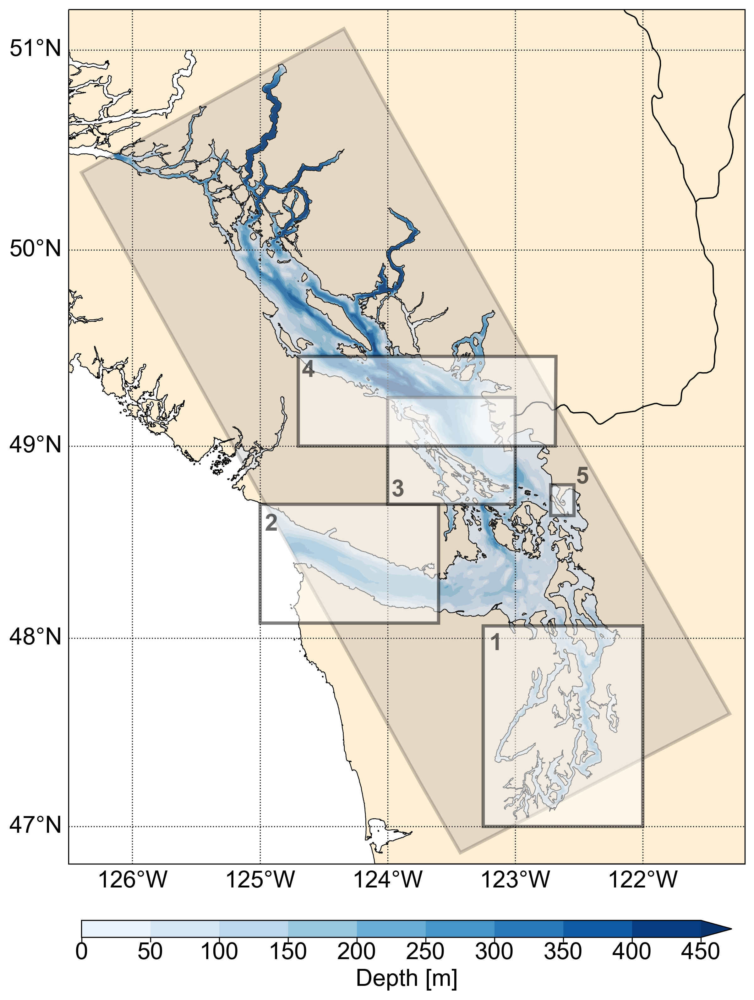

In [8]:
# The code for this figure is a modified version of code from Ben Moore-Maley
# --------- Figure setup ---------
proj_ref = crs.PlateCarree()
fig = plt.figure(figsize=(30, 12))
gs = plt.GridSpec(1, 3, wspace=0.05)

# --------- Left panel -----------
# Make map
extent = [-126.5, -121.2, 46.8, 51.2]
proj = crs.Mercator(numpy.mean(extent[:2]), *extent[2:])
ax = fig.add_subplot(gs[0], projection=proj)
ax.set_extent(extent)
ax.add_feature(feature.GSHHSFeature('full', edgecolor='k', linewidth=0.6, facecolor='papayawhip'))
ax.add_feature(feature.NaturalEarthFeature(
    category='physical', name='rivers_lake_centerlines',
    scale='10m', facecolor='none', edgecolor='k',
))
gl = ax.gridlines(linestyle=":", color='k', draw_labels=True)
gl.top_labels, gl.right_labels = False, False

# Overlay model domain
p={}
domain_box = numpy.array([(lon[ji], lat[ji]) for ji in [(0, 0), (0, -1), (-1, -1), (-1, 0)]])
c = ax.contourf(lon, lat, bathy.Bathymetry, levels=numpy.arange(0, 451, 50), cmap='Blues', extend='max', transform=proj_ref)
ax.add_patch(patches.Polygon(domain_box, ec='k', fc='gray', lw=2.5, alpha=0.2, transform=proj_ref, zorder=2))
ax.add_patch(patches.Polygon(jdf_box,fc='w', ec='k', alpha=0.5, lw=2.5, transform=proj_ref, zorder=2))
ax.add_patch(patches.Polygon(pugetSound_box,fc='w', ec='k', alpha=0.5, lw=2.5, transform=proj_ref, zorder=2))
ax.add_patch(patches.Polygon(cowichan_box,fc='w', ec='k', alpha=0.5, lw=2.5, transform=proj_ref, zorder=2))
ax.add_patch(patches.Polygon(lummi_box,fc='w', ec='k', alpha=0.5, lw=2.5, transform=proj_ref, zorder=2))
ax.add_patch(patches.Polygon(sog_box,fc='w', ec='k', alpha=0.5, lw=2.5, transform=proj_ref, zorder=2))

# Annotations
for ann in annotations_fine:
    if ann['alpha'] is not None:
        ax.text(*ann['xy'], ann['name'], 
                transform=ax.transAxes, 
                rotation=ann['r'], 
                fontdict={'weight': ann['wt'], 'color': 'k'},
                ha=ann['ha'],
                alpha=ann['alpha']
               )
# Colorbar
cax = fig.add_axes([0.135, 0.06, 0.23, 0.015])
fig.colorbar(c, cax=cax, orientation='horizontal', label='Depth [m]')
#plt.savefig(graphics_dir/'SSC_model_domain_withBoundaries.png')

# Second attempt for masked region 
## Based on SSC grid

## Create mask regions based on array index

In [9]:
mask = nc.Dataset('/data/SalishSeaCast/grid/mesh_mask201702.nc')
lats = mask['nav_lat'][:]
lons = mask['nav_lon'][:]

In [10]:
# grid cell locations [y-grid,x-grid]

# General regional interests
# Juan de Fuca
JDF = numpy.full(lon.shape, True)
JDF[225:475,0:170] = False
JDF_masked = numpy.ma.masked_where(JDF, numpy.ones(lon.shape))

# box method
jdf_edges=[[225,0],[225,173],[475,173],[475,0]]
jdf_box = numpy.array([[lons[edge[0],edge[1]],lats[edge[0],edge[1]]] for edge in jdf_edges])

# Puget Sound
PS = numpy.full(lon.shape, True)
PS[0:215,50:325] = False
PS_masked = numpy.ma.masked_where(PS, numpy.ones(lon.shape))

# box method
ps_edges=[[0,50],[0,325],[215,325],[215,50]]
ps_box = numpy.array([[lons[edge[0],edge[1]],lats[edge[0],edge[1]]] for edge in ps_edges])

# Strait of Georgia
SOG = numpy.full(lon.shape, True)
SOG[335:715,100:-1] = False
SOG_masked = numpy.ma.masked_where(SOG, numpy.ones(lon.shape))

# box method
sog_edges=[[335,100],[335,-1],[715,-1],[715,100]]
sog_box = numpy.array([[lons[edge[0],edge[1]],lats[edge[0],edge[1]]] for edge in sog_edges])

# Areas of import to two Coast Salish communities
# Cowichan
cwchn = numpy.full(lon.shape, True)
cwchn[340:500,150:295] = False
cwchn_masked = numpy.ma.masked_where(cwchn, numpy.ones(lon.shape))

# box method
cwchn_edges=[[340,150],[340,295],[500,295],[500,150]]
cwchn_box = numpy.array([[lons[edge[0],edge[1]],lats[edge[0],edge[1]]] for edge in cwchn_edges])

# Lummi
lummi = numpy.full(lon.shape, True)
lummi[375:410,300:340] = False
lummi_masked = numpy.ma.masked_where(lummi, numpy.ones(lon.shape))

# box method
lummi_edges=[[375,300],[375,340],[410,340],[410,300]]
lummi_box = numpy.array([[lons[edge[0],edge[1]],lats[edge[0],edge[1]]] for edge in lummi_edges])



## Plot masked regions

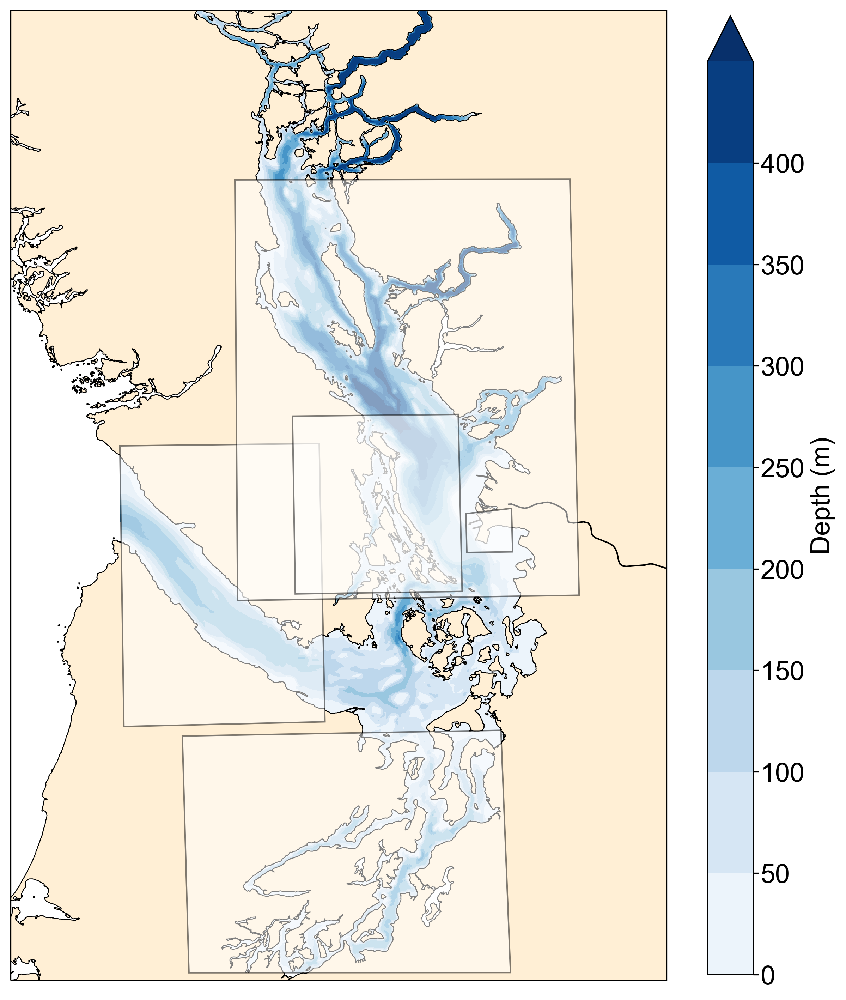

In [11]:
# --------- Figure setup ---------
proj_ref = crs.PlateCarree()
lw = 1 # linewidth for regional boundary boxes
fs = 12 #fontsize for colorbar

# The code for this figure is a modified version of code from Ben Moore-Maley
fig, ax = plt.subplots(1, 1, 
              figsize=(10, 15), #(width, height)
              subplot_kw={'projection': rotated_crs, 
                "facecolor": "white"},
              gridspec_kw={
                   'width_ratios': [1],
                   'height_ratios': [1],
                   'wspace': 0.1,
                  'hspace':-.2}
)

# --------- Left panel -----------
# Make map
extent = [-126.5, -121.2, 46.8, 51.2]
proj = crs.Mercator(numpy.mean(extent[:2]), *extent[2:])
ax.set_extent([-124, -123.75, lat.min()-0.15, lat.max()])      
ax.add_feature(feature.GSHHSFeature('full', edgecolor='k', linewidth=0.6, facecolor='papayawhip'))
ax.add_feature(feature.NaturalEarthFeature(
    category='physical', name='rivers_lake_centerlines',
    scale='10m', facecolor='none', edgecolor='k',
))
# Overlay model domain
domain_box = numpy.array([(lon[ji], lat[ji]) for ji in [(0, 0), (0, -1), (-1, -1), (-1, 0)]])
c = ax.contourf(lon, lat, bathy.Bathymetry, levels=numpy.arange(0, 451, 50), cmap='Blues', extend='max', transform=proj_ref)
p[1]=ax.add_patch(patches.Polygon(jdf_box, fc='w', ec='k', alpha=0.5, lw=lw, transform=proj_ref, zorder=2))
p[2]=ax.add_patch(patches.Polygon(sog_box, fc='w', ec='k', alpha=0.5, lw=lw, transform=proj_ref, zorder=2))
p[3]=ax.add_patch(patches.Polygon(ps_box, fc='w', ec='k', alpha=0.5, lw=lw, transform=proj_ref, zorder=2))
p[4]=ax.add_patch(patches.Polygon(cwchn_box, fc='w', ec='k', alpha=0.5, lw=lw, transform=proj_ref, zorder=3))
p[5]=ax.add_patch(patches.Polygon(lummi_box, fc='w', ec='k', alpha=0.5, lw=lw, transform=proj_ref, zorder=3))
#cax = fig.add_axes([0.95, 0.215, 0.035, 0.55])
#cbar=fig.colorbar(, cax=cax, orientation='vertical', label='Depth (m)')

# # Annotations
# loc = p[5].get_xy()
# for idx,ann in enumerate(annotations_fine):   
#     if ann['alpha'] is not None:
#         ax.text(loc[idx][0],loc[idx][1], ann['name'], 
#                 transform=proj_ref, 
#                 rotation=ann['r'], 
#                 fontdict={'weight': ann['wt'], 'color': 'k'},
#                 ha=ann['ha'],
#                 alpha=ann['alpha']
#                )
        
cbar=fig.colorbar(c, 
                   ax=ax, 
                   pad=0.05, shrink=0.8,
                   location='right', 
                   label='Depth (m)')
labels=numpy.arange(0,450,50)
cbar.set_ticks(labels)

if custom_dpi>=600:
    plt.savefig(graphics_dir/'SSC_model_domain_withBoundaries.png')
else:
    plt.savefig(graphics_dir/'SSC_model_domain_withBoundaries_small.png')
    


# Create 2018 Vessel Time Exposure maps

In [12]:
ship_types = [
    'tanker', 
    'atb', 
    'barge', 
    'cargo',
    'ferry',  
    'other',
    'smallpass',
    'fishing',
    'cruise',
    'all'
]
months = array('i',range(1,13))
vte={} # vessel time exposure by monts
max_vte=[] # list of maximum VTE across months, by ship
all_vte=[] # combined sum of VTE across months and ship type to compare with "all" .tiffs

# Add VTE across all months in 2018
for ship in ship_types:
    for month in months:
        if month==1:
            vte[ship] = rioxarray.open_rasterio(
                geotiff_directory/f"{ship}_2018_{month:02.0f}.tif",
                masked=True
            )
            # store max value across all vessels
            max_val = vte[ship][0].max().values.item()
        else:
            vte_monthly = rioxarray.open_rasterio(
                geotiff_directory/f"{ship}_2018_{month:02.0f}.tif",
                masked=True
            )
            vte[ship] += vte_monthly
            max_val = max(max_val,vte_monthly.max().values.item())
    max_val_total = vte[ship][0].max().values.item()
    vte[ship] = vte[ship].where(vte[ship]!=0)
    
    # Collate list of max VTE across months by ship type
    max_vte.append(max_val)
    # Add all ship VTE to compare with all_2018_XX.tif summed across XX
    if ship != 'all':
        try:
            all_vte += vte[ship]
        except ValueError:
            all_vte = vte[ship]

In [13]:
vte['tanker'].sum().item()

224291.796875

### Validate += method by comparing "all" .tiffs to sum across vessels 

In [14]:
err=numpy.subtract(all_vte,vte['all']).sum().item()
print(f'Difference between sum across vessel .tiffs and "all" .tiffs: {err:.2e} hrs/km^2')

Difference between sum across vessel .tiffs and "all" .tiffs: -1.83e-04 hrs/km^2


Fractions of a second per km^2 is good enough

In [15]:
# converte vte from hrs/km^2 to days/km^2 to get a better sense of daily traffic (because I am curious....)
[vte/24 for vte in max_vte]

[0.673682451248169,
 1.4888213475545247,
 14.630208333333334,
 3.945974032084147,
 6.956753412882487,
 8.430367787679037,
 8.698737462361654,
 12.900375366210938,
 1.115851879119873,
 20.219043731689453]

Barges were present at most every-other-day in a given km^2

### Plot VTE for select traffic

In [16]:
max_val_total

3637.5859375

### Now for six-panel graphic

In [17]:
#da = rioxarray.open_rasterio(geotiff_directory/"all_2018_01.tif",masked=True)
ship = 'cargo'
# create plotting mesh and set all zero and _FillValues to NaN 
x, y = numpy.meshgrid(vte[ship].x, vte[ship].y)
# set the interval between levels
step = (
    numpy.ceil(numpy.log10(numpy.max(max_val_total))) - numpy.floor(numpy.log10(0.01)))/50
# graphic levels
lev_exp = numpy.arange(
    numpy.floor(numpy.log10(0.01)),
    numpy.ceil(numpy.log10(max_val_total)),
    step
)
# for log-scale plot
levs = numpy.power(10, lev_exp)

### Plot with colorbar for each map

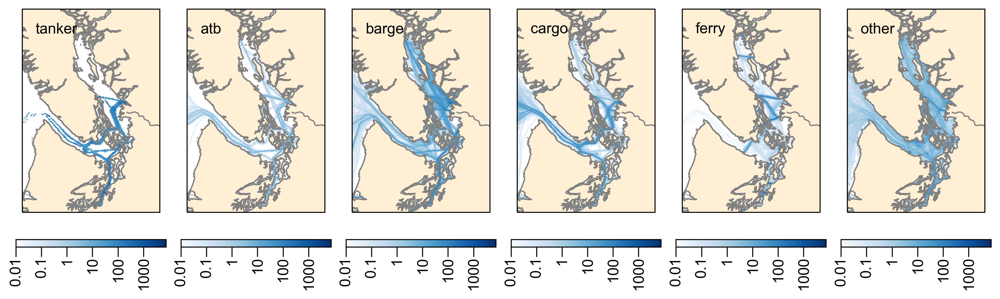

In [18]:
ec='grey'
lw=1
fs=12
ship_types = [
    'tanker', 
    'atb', 
    'barge', 
    'cargo',
    'ferry',  
    'other'
]

fig, ax = plt.subplots(1, 6, 
              figsize=(14, 4), #(width, height)
              subplot_kw={'projection': rotated_crs, 
                "facecolor": "white"},
              gridspec_kw={
                   'width_ratios': [1,1,1,1,1,1],
                   'height_ratios': [1],
                   'wspace': 0.1,
                  'hspace':-.2}
)

for idx,ship in enumerate(ship_types):

    ax[idx].set_extent([-124, -123.75, lat.min()-0.15, lat.max()])
    # add text with ship type
    anchored_text = AnchoredText(ship, loc=2,prop=dict(size=fs),frameon=False)
    ax[idx].add_artist(anchored_text)
    #ax[0,idx].text(-45.99,0.682*lat.max(),ship)
    ax[idx].add_feature(feature.GSHHSFeature(
        'full', edgecolor=ec, linewidth=lw, facecolor='papayawhip'))
    ax[idx].add_feature(feature.NaturalEarthFeature(
        category='physical', name='rivers_lake_centerlines',
        scale='10m', facecolor='none', linewidth=lw, edgecolor=ec,
    ))
    C=ax[idx].pcolormesh(x, y, 
        vte[ship][0],
        vmin=levs[0],
        vmax=levs[-1],
        cmap=cmo.cm.Blues, 
        norm=colors.LogNorm(),
        transform=plain_crs)

    cb = fig.colorbar(C, 
        ax=ax[idx], 
        location='bottom',
        ticks=[1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3],
        pad=0.1
        );

    #cb.set_ticks([1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3])
    cb.set_ticklabels(['0.01', '0.1', '1', '10', '100', '1000'])
    minorticks = C.norm(numpy.arange(1, 10, 2))
    cb.ax.xaxis.set_ticks(minorticks, minor=True)
    cb.ax.tick_params(labelsize=12)
    cb.ax.tick_params(which='major', rotation=90,length=8, color='k') 
    cb.ax.tick_params(which='minor', length=4, color='k')
    cb.ax.minorticks_on()
    

### Plot with one colorbar

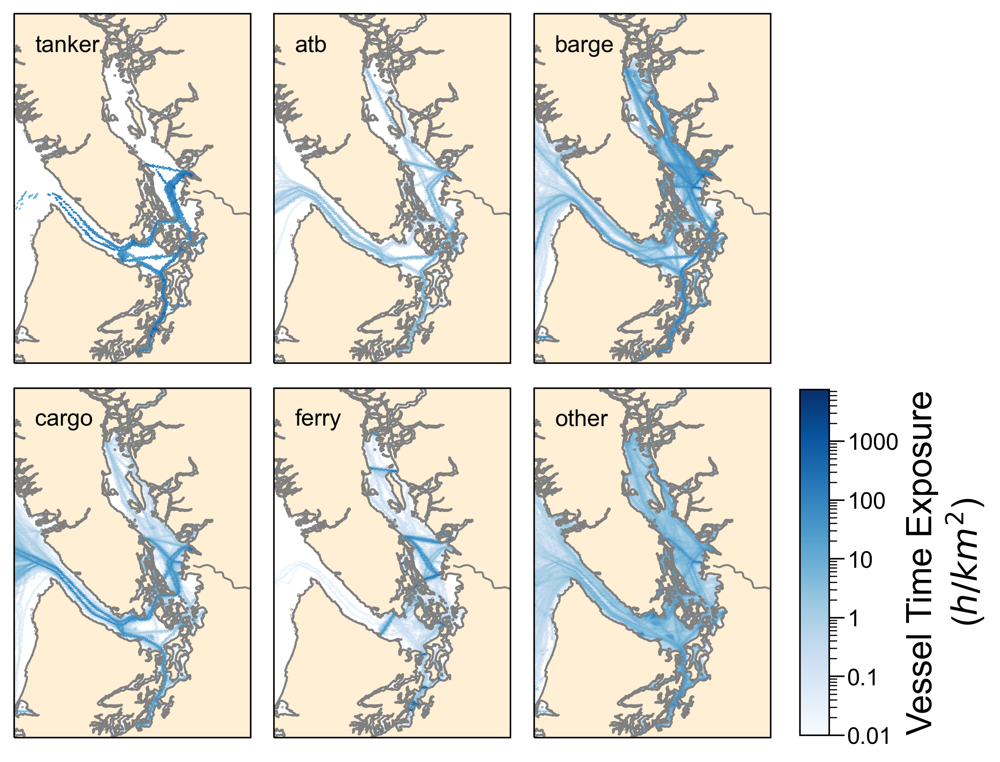

In [19]:
ec='grey'
lw=1
fs=12
ship_types = [
    'tanker', 
    'atb', 
    'barge', 
    'cargo',
    'ferry',  
    'other'
]

fig, ax = plt.subplots(2, 3, 
              figsize=(7, 8), #(width, height)
              subplot_kw={'projection': rotated_crs, 
                "facecolor": "white"},
              gridspec_kw={
                   'width_ratios': [1,1,1],
                   'height_ratios': [1,1],
                   'wspace': 0.1,
                  'hspace':-.2}
)

for idx,ship in enumerate(ship_types):
    if idx<3:
        ax[0,idx].set_extent([-124, -123.75, lat.min()-0.15, lat.max()])
        # add text with ship type
        anchored_text = AnchoredText(ship, loc=2,prop=dict(size=fs),frameon=False)
        ax[0,idx].add_artist(anchored_text)
        #ax[0,idx].text(-45.99,0.682*lat.max(),ship)
        ax[0,idx].add_feature(feature.GSHHSFeature(
            'full', edgecolor=ec, linewidth=lw, facecolor='papayawhip'))
        ax[0,idx].add_feature(feature.NaturalEarthFeature(
            category='physical', name='rivers_lake_centerlines',
            scale='10m', facecolor='none', linewidth=lw, edgecolor=ec,
        ))
        C=ax[0,idx].pcolormesh(x, y, 
            vte[ship][0],
            vmin=levs[0],
            vmax=levs[-1],
            cmap=cmo.cm.Blues, 
            norm=colors.LogNorm(),
            transform=plain_crs)
    else:
        ax[1,idx-3].set_extent([-124, -123.75, lat.min()-0.15, lat.max()])
        # add text with ship type
        anchored_text = AnchoredText(ship, loc=2,prop=dict(size=fs),frameon=False)
        ax[1,idx-3].add_artist(anchored_text)
        #ax[1,idx-3].text(-45.99,0.682*lat.max(),ship)
        ax[1,idx-3].add_feature(feature.GSHHSFeature(
            'full', edgecolor=ec, linewidth=lw, facecolor='papayawhip'))
        ax[1,idx-3].add_feature(feature.NaturalEarthFeature(
            category='physical', name='rivers_lake_centerlines',
            scale='10m', facecolor='none', linewidth=lw, edgecolor=ec,
        ))
        C=ax[1,idx-3].pcolormesh(x, y, 
            vte[ship][0],
            vmin=levs[0],
            vmax=levs[-1],
            cmap=cmo.cm.Blues, 
            norm=colors.LogNorm(),
            transform=plain_crs)        
cb_ax = fig.add_axes([.93,.18,.03,.31])
cb = fig.colorbar(C, 
    cax=cb_ax, 
    ticks=[1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3],
    pad=0.1
    );

#cb.set_ticks([1e-2, 1e-1, 1e0, 1e1, 1e2, 1e3])
cb.set_ticklabels(['0.01', '0.1', '1', '10', '100', '1000'])
minorticks = C.norm(numpy.arange(1, 10, 2))
cb.ax.xaxis.set_ticks(minorticks, minor=True)
cb.ax.tick_params(labelsize=12)
cb.ax.tick_params(which='major', length=8, color='k') 
cb.ax.tick_params(which='minor', length=4, color='k')
cb.ax.minorticks_on()
cb.set_label('Vessel Time Exposure\n($h/km^2$)');
if custom_dpi>=600:
    plt.savefig(graphics_dir/'ship_tracks/VTE_allTraffic_6panel.png')
else:
    plt.savefig(graphics_dir/'ship_tracks/VTE_allTraffic_6panel_small.png')
    
plt.show()

In [20]:
print(f"Barge (median,mean): {vte['barge'][0].median().values.item():3.2f}, {vte['barge'][0].mean().values.item():3.2f}")
print(f"Tanker (median,mean): {vte['tanker'][0].median().values.item():3.2f},{vte['tanker'][0].mean().values.item():3.2f}")

Barge (median,mean): 0.15, 6.25
Tanker (median,mean): 67.64,111.87


In [21]:
fig, ax = plt.subplots()

t = ax.text(0.5, 0.5, 'Text')

fonts = ['xx-small', 'x-small', 'small', 'medium', 'large', 
         'x-large', 'xx-large', 'larger', 'smaller']

for font in fonts:
    t.set_fontsize(font)
    print (font, round(t.get_fontsize(), 2))

plt.close()    

xx-small 10.42
x-small 12.49
small 14.99
medium 18.0
large 21.6
x-large 25.92
xx-large 31.1
larger 21.6
smaller 14.99


### Previous code below

In [22]:
ssc_bathymetry = '/ocean/rmueller/SalishSeaCast/grid/bathymetry_201702.nc'
ssc_mask = '/ocean/rmueller/SalishSeaCast/grid/mesh_mask201702.nc'

fnames = [
    'Lagrangian_akns.dat',
    'Lagrangian_bunker.dat',
    'Lagrangian_dilbit.dat',
    'Lagrangian_diesel.dat',
    'Lagrangian_gas.dat',
    'Lagrangian_jet.dat',
    'Lagrangian_other.dat'
]
MIDOSSlabels=[
    'ANS',
    'Bunker-C',
    'Dilbit',
    'Diesel',
    'Diesel',
    'Diesel',
    'Bunker-C'
]

### Load 10,000 spills files on Salish

In [23]:
spills_dir_name = 'spill_files_091921'
# On Salish
data_directory = Path(f'/ocean/rmueller/MIDOSS/{spills_dir_name}')
graphics_directory = Path('/ocean/rmueller/MIDOSS/graphics/MEOPAR_ASM_2022')
# Load Oil Attribution file 
oil_attribution_file = '/data/MIDOSS/marine_transport_data/oil_attribution.yaml'
# create list of spill files to plot/evaluate
filenames = sorted(glob(os.path.join(data_directory,"*.csv")))

our_spills = '/data/sallen/results/MIDOSS/'+\
'SalishSea_oil_spills_corrected_24mar2022_indomain_fixedcol_fixedwrap.csv'

#our_spills = '/ocean/rmueller/MIDOSS/spill_files_091921/chosen_for_monte_carlo/SalishSea_oil_spills_corrected_24mar2022.csv'

In [24]:
df={}
for index,fn in enumerate(filenames):    
    if index==3:
        print(index,our_spills)
        df[index] = pandas.read_csv(our_spills)
    else:
        print(index,fn)
        df[index] = pandas.read_csv(fn)
    # rename lagrangian files as oil types (for plotting)
    df[index]['Lagrangian_template'] = df[index]['Lagrangian_template'].replace(
         fnames, MIDOSSlabels
    )
    if index == 0:
        df_combined = df[index].copy()
        
    else:
        df_combined = pandas.concat([df_combined, df[index]])
    

0 /ocean/rmueller/MIDOSS/spill_files_091921/SalishSea_oil_spills_1.csv
1 /ocean/rmueller/MIDOSS/spill_files_091921/SalishSea_oil_spills_2.csv
2 /ocean/rmueller/MIDOSS/spill_files_091921/SalishSea_oil_spills_3.csv
3 /data/sallen/results/MIDOSS/SalishSea_oil_spills_corrected_24mar2022_indomain_fixedcol_fixedwrap.csv
4 /ocean/rmueller/MIDOSS/spill_files_091921/SalishSea_oil_spills_5.csv
5 /ocean/rmueller/MIDOSS/spill_files_091921/SalishSea_oil_spills_6.csv
6 /ocean/rmueller/MIDOSS/spill_files_091921/SalishSea_oil_spills_7.csv
7 /ocean/rmueller/MIDOSS/spill_files_091921/SalishSea_oil_spills_8.csv
8 /ocean/rmueller/MIDOSS/spill_files_091921/SalishSea_oil_spills_9.csv


In [25]:
# load SSC grid and mask
bathy = xarray.open_dataset(ssc_bathymetry)
mask = xarray.open_dataset(ssc_mask)
# create mask for plotting...?
tmask = mask.tmask[0,0,:,:]

In [26]:
a_count={}
a_vol = {}

### Bin spills by number of spills and volume of spills for each 10,000 spills file

In [27]:
# number of bins to use in histograms
nbins_x=50
nbins_y=100

In [28]:
# loop though all files and create spill/volume 2d histograms
for index,fn in enumerate(filenames):
    #if index != 3:
        print(index)
        
        # histogram by number of spills
        h_count,xe,ye = numpy.histogram2d(
            numpy.array(df[index].spill_lon), 
            numpy.array(df[index].spill_lat), 
            bins=(nbins_x,nbins_y)
        );
        # historgram by spill volume
        h_vol,xe,ye = numpy.histogram2d(
            df[index].spill_lon, 
            df[index].spill_lat, 
            weights = df[index].spill_volume,
            bins=(nbins_x,nbins_y)
        );
        # combine histrograms into 3D arrays
        a_count[index]=h_count
        a_vol[index]=h_vol
        if index == 0:
            count_hist_3d = a_count[0]
            vol_hist_3d = a_vol[0]
        else:
            count_hist_3d=numpy.dstack([count_hist_3d,h_count])
            vol_hist_3d=numpy.dstack([vol_hist_3d,h_vol])
Y,X = numpy.meshgrid(ye,xe)

0
1
2
3
4
5
6
7
8


### Create 2d array with range of values across 10,000 spills files of:
- number of spills per histogram cell
- volume of oil spilled in histogram cells

In [43]:
count_hist_3d[:,:,3].shape

(50, 100)

In [44]:
count_hist_range = count_hist_3d.max(axis=2) - count_hist_3d.min(axis=2)
vol_hist_range = vol_hist_3d.max(axis=2) - vol_hist_3d.min(axis=2)
count_hist_median = numpy.median(count_hist_3d, axis=2)
vol_hist_median = numpy.median(vol_hist_3d, axis=2)
# calculate difference between our spill file and median spills
count_hist_diff = count_hist_3d[:,:,3]-count_hist_median
vol_hist_diff=vol_hist_3d[:,:,3]-vol_hist_median
# calculate Quantiles
count_q={}
vol_q={}
count_q['25']=numpy.quantile(count_hist_3d, axis=2, q = .25)
count_q['50']=numpy.quantile(count_hist_3d, axis=2, q = .50)
count_q['75']=numpy.quantile(count_hist_3d, axis=2, q = .75)

vol_q['25']=numpy.quantile(vol_hist_3d, axis=2, q = .25)
vol_q['50']=numpy.quantile(vol_hist_3d, axis=2, q = .50)
vol_q['75']=numpy.quantile(vol_hist_3d, axis=2, q = .75)

# get range between 25% and 75% quantile
count_q['range']= count_q['75']-count_q['25']
vol_q['range']= vol_q['75']-vol_q['25']

### Create histograms for `try3` runs

### Need to transform spill locations to use hist2d with Cartopy.  See  
https://stackoverflow.com/questions/50611018/cartopy-heatmap-over-openstreetmap-background

/tmp/ipykernel_29115/1870309125.py:98: UserWarning: Use the colorbar set_ticks() method instead.
  cbar0.ax.set_xticks(numpy.arange(0,r3_count.max(),25))
/tmp/ipykernel_29115/1870309125.py:99: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar0.ax.set_xticklabels([0,100,200,300,400,500,600])
/tmp/ipykernel_29115/1870309125.py:100: UserWarning: Use the colorbar set_ticks() method instead.
  cbar1.ax.set_xticks(1e7*numpy.array([0,1,2,3,4,5]))
/tmp/ipykernel_29115/1870309125.py:101: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar1.ax.set_xticklabels([0,10,20,30,40,50])


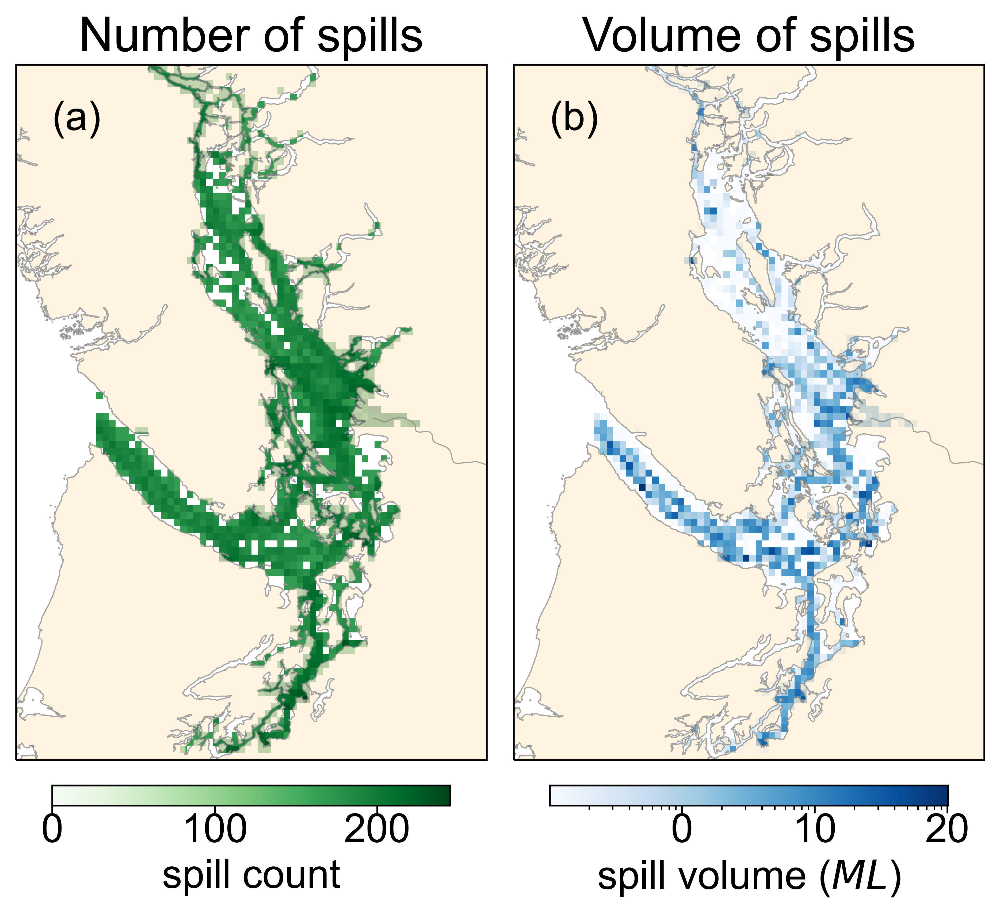

In [30]:

#linewidth for land mask
lw=0.5

# color of shoreline
ec='grey'

fig, axs = plt.subplots(1, 2, 
    figsize=(8, 7), #(width, height)
    dpi=custom_dpi, 
    subplot_kw={'projection': rotated_crs, 
        "facecolor": "white"},
    gridspec_kw={
       'width_ratios': [1,1],
       'height_ratios': [1],
       'wspace': 0,
       'hspace': 0}
)
for ax in axs:
    ax.add_feature(feature.GSHHSFeature(
        'full', edgecolor=ec, linewidth=lw, facecolor='papayawhip',
         zorder=1, alpha=0.7
    ))
    ax.add_feature(feature.NaturalEarthFeature(
        category='physical', name='rivers_lake_centerlines',
        scale='10m',  edgecolor=ec, linewidth=lw, facecolor='none',
        zorder=1, alpha=0.7
    ))
    ax.set_extent([-124, -123.75, lat.min()-0.15, lat.max()])
    ax.set_aspect(1)

# do coordinate conversion of (x,y)
xynps = axs[0].projection.transform_points(
    crs.Geodetic(), 
    numpy.array(df[3].spill_lon), 
    numpy.array(df[3].spill_lat))

# ~~~ Number of spills ~~~
# calculate histograms for number of spills and plot using pcolormesh
r3_count,xe,ye = numpy.histogram2d(
    xynps[:,0], 
    xynps[:,1],
    bins=(nbins_x,nbins_y)
);

Yr3,Xr3 = numpy.meshgrid(ye,xe)

# ~~~ Number of spills ~~~
# calculate histograms for number of spills and plot using pcolormesh
r3_count,xe,ye = numpy.histogram2d(
    xynps[:,0], 
    xynps[:,1],
    bins=(nbins_x,nbins_y)
);

# ~~~ Volume of spills ~~~

# calculate histograms for number of spills and plot using pcolormesh
r3_vol,xe,ye = numpy.histogram2d(
    xynps[:,0], 
    xynps[:,1], 
    weights = df[3].spill_volume,
    bins=(nbins_x,nbins_y)
); 

C_count=axs[0].pcolormesh(Xr3, Yr3, r3_count, 
    cmap='Greens',
    vmin=0.00001,
    vmax=r3_count.max(),
    zorder=0,
    norm=colors.LogNorm())
C_vol=axs[1].pcolormesh(Xr3, Yr3, r3_vol, 
    cmap='Blues',
    vmin=.001*r3_vol.max(),
    vmax=r3_vol.max(),
    zorder=0,
    norm=colors.LogNorm())

axs[0].set_title('Number of spills');
axs[1].set_title('Volume of spills');

# Use anchored text to make location of subplot labels consistent between figures
a_anchored = AnchoredText("(a)", loc=2,frameon=False)
b_anchored = AnchoredText("(b)", loc=2,frameon=False)
axs[0].add_artist(a_anchored)
axs[1].add_artist(b_anchored)

# Add colorbars
cbar0=fig.colorbar(C_count, 
                   ax=axs[0], 
                   pad=0.03, shrink=0.8,
                   location='bottom', 
                   label='spill count')
cbar1=fig.colorbar(C_vol, 
                   ax=axs[1],  
                   pad=0.03, shrink=0.8,
                   location='bottom',
                   label='spill volume ($ML$)')
cbar0.ax.set_xticks(numpy.arange(0,r3_count.max(),25))
cbar0.ax.set_xticklabels([0,100,200,300,400,500,600])
cbar1.ax.set_xticks(1e7*numpy.array([0,1,2,3,4,5]))
cbar1.ax.set_xticklabels([0,10,20,30,40,50])

if custom_dpi>=600:
    plt.savefig(graphics_dir/'SpillCount_SpillVolume_log.png')
else:
    plt.savefig(graphics_dir/'SpillCount_SpillVolume_small_log.png')

#### without log scale

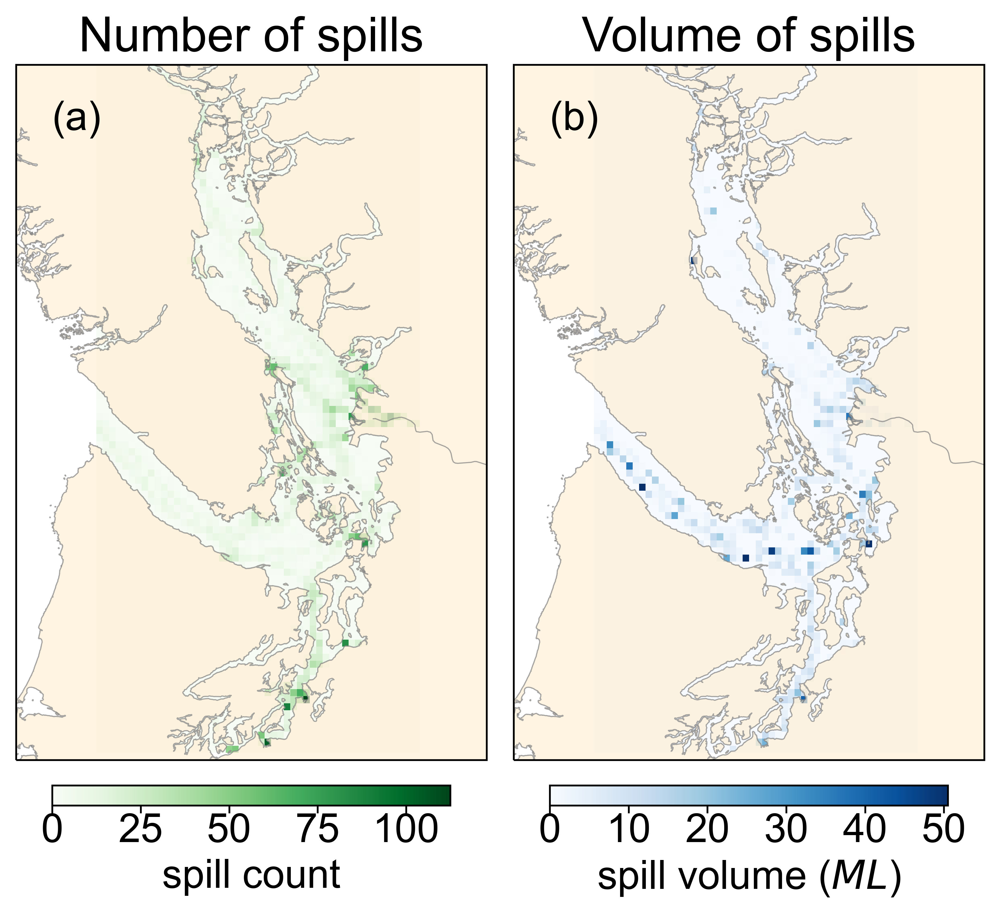

In [31]:
#linewidth for land mask
lw=0.5

# color of shoreline
ec='grey'
nbins_x=50
nbins_y=100

fig, axs = plt.subplots(1, 2, 
    figsize=(8, 7), #(width, height)
    dpi=custom_dpi, 
    subplot_kw={'projection': rotated_crs, 
        "facecolor": "white"},
    gridspec_kw={
       'width_ratios': [1,1],
       'height_ratios': [1],
       'wspace': 0,
       'hspace': 0}
)
for ax in axs:
    ax.add_feature(feature.GSHHSFeature(
        'full', edgecolor=ec, linewidth=lw, facecolor='papayawhip',
         zorder=1, alpha=0.7
    ))
    ax.add_feature(feature.NaturalEarthFeature(
        category='physical', name='rivers_lake_centerlines',
        scale='10m',  edgecolor=ec, linewidth=lw, facecolor='none',
        zorder=1, alpha=0.7
    ))
    ax.set_extent([-124, -123.75, lat.min()-0.15, lat.max()])
    ax.set_aspect(1)

# do coordinate conversion of (x,y)
xynps = axs[0].projection.transform_points(
    crs.Geodetic(), 
    numpy.array(df[3].spill_lon), 
    numpy.array(df[3].spill_lat))

# ~~~ Number of spills ~~~
# calculate histograms for number of spills and plot using pcolormesh
r3_count,xe,ye = numpy.histogram2d(
    xynps[:,0], 
    xynps[:,1],
    bins=(nbins_x,nbins_y)
);

Yr3,Xr3 = numpy.meshgrid(ye,xe)

# ~~~ Number of spills ~~~
# calculate histograms for number of spills and plot using pcolormesh
r3_count,xe,ye = numpy.histogram2d(
    xynps[:,0], 
    xynps[:,1],
    bins=(nbins_x,nbins_y)
);

# ~~~ Volume of spills ~~~

# calculate histograms for number of spills and plot using pcolormesh
r3_vol,xe,ye = numpy.histogram2d(
    xynps[:,0], 
    xynps[:,1], 
    weights = df[3].spill_volume,
    bins=(nbins_x,nbins_y)
); 

C_count=axs[0].pcolormesh(Xr3, Yr3, r3_count, 
    cmap='Greens',
    vmin=0,
    vmax=0.5*r3_count.max(),
    zorder=0)
C_vol=axs[1].pcolormesh(Xr3, Yr3, r3_vol, 
    cmap='Blues',
    vmin=0,
    vmax=0.5*r3_vol.max(),
    zorder=0)

axs[0].set_title('Number of spills');
axs[1].set_title('Volume of spills');

# Use anchored text to make location of subplot labels consistent between figures
a_anchored = AnchoredText("(a)", loc=2,frameon=False)
b_anchored = AnchoredText("(b)", loc=2,frameon=False)
axs[0].add_artist(a_anchored)
axs[1].add_artist(b_anchored)

# Add colorbars
cbar0=fig.colorbar(C_count, 
    ax=axs[0], 
    pad=0.03, shrink=0.8,
    location='bottom', 
    label='spill count',
    ticks=[0,25,50,75,100])
cbar1=fig.colorbar(C_vol, 
    ax=axs[1],  
    pad=0.03, shrink=0.8,
    location='bottom',
    label='spill volume ($ML$)',
    ticks=[0,1e7,2e7,3e7,4e7,5e7,6e7])
cbar0.ax.set_xticklabels([0,25,50,75,100])
cbar1.ax.set_xticklabels([0,10,20,30,40,50,60])

if custom_dpi>=600:
    plt.savefig(graphics_dir/'SpillCount_SpillVolume.png')
else:
    plt.savefig(graphics_dir/'SpillCount_SpillVolume_small.png')

In [ ]:
### compare our file with median spill

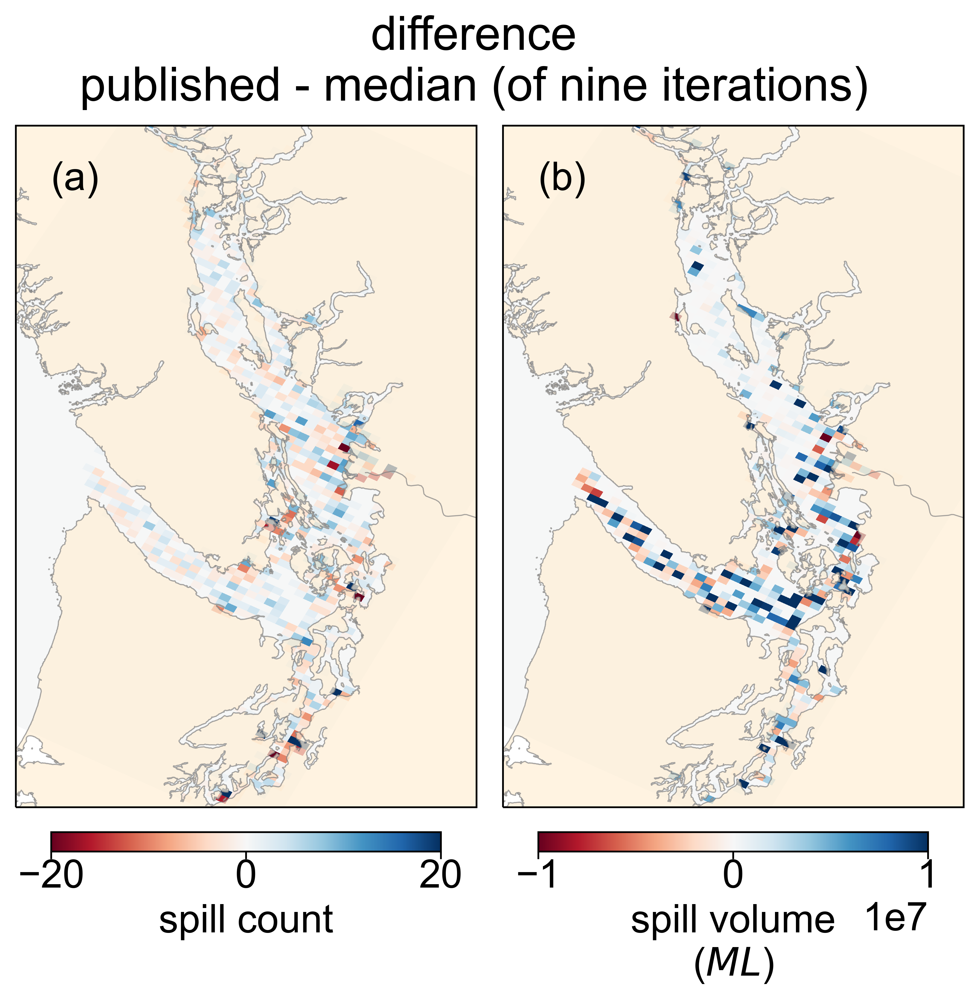

In [55]:
#linewidth for land mask
lw=0.5

# color of shoreline
ec='grey'
nbins_x=50
nbins_y=100

fig, axs = plt.subplots(1, 2, 
    figsize=(8, 7), #(width, height)
    dpi=custom_dpi, 
    subplot_kw={'projection': rotated_crs, 
        "facecolor": "white"},
    gridspec_kw={
       'width_ratios': [1,1],
       'height_ratios': [1],
       'wspace': 0,
       'hspace': 0}
)
for ax in axs:
    ax.add_feature(feature.GSHHSFeature(
        'full', edgecolor=ec, linewidth=lw, facecolor='papayawhip',
         zorder=1, alpha=0.7
    ))
    ax.add_feature(feature.NaturalEarthFeature(
        category='physical', name='rivers_lake_centerlines',
        scale='10m',  edgecolor=ec, linewidth=lw, facecolor='none',
        zorder=1, alpha=0.7
    ))
    ax.set_extent([-124, -123.75, lat.min()-0.15, lat.max()])
    ax.set_aspect(1)

# do coordinate conversion of (x,y)
xynps = axs[0].projection.transform_points(
    crs.Geodetic(), 
    numpy.array(df[3].spill_lon), 
    numpy.array(df[3].spill_lat))

# ~~~ Number of spills ~~~
# calculate histograms for number of spills and plot using pcolormesh
r3_count,xe,ye = numpy.histogram2d(
    xynps[:,0], 
    xynps[:,1],
    bins=(nbins_x,nbins_y)
);

Yr3,Xr3 = numpy.meshgrid(ye,xe)



# ~~~ Volume of spills ~~~

# calculate histograms for number of spills and plot using pcolormesh
r3_vol,xe,ye = numpy.histogram2d(
    xynps[:,0], 
    xynps[:,1], 
    weights = df[3].spill_volume,
    bins=(nbins_x,nbins_y)
); 

C_count=axs[0].pcolormesh(X,Y, count_hist_diff, 
    cmap='RdBu',
    vmin=-20,
    vmax=20,
    zorder=0,
    transform=plain_crs)
C_vol=axs[1].pcolormesh(X, Y, vol_hist_diff, 
    vmin=-1e7,
    vmax=1e7,
    cmap='RdBu',
    zorder=0,
    transform=plain_crs)

fig.suptitle('difference\npublished - median (of nine iterations)')
# Use anchored text to make location of subplot labels consistent between figures
a_anchored = AnchoredText("(a)", loc=2,frameon=False)
b_anchored = AnchoredText("(b)", loc=2,frameon=False)
axs[0].add_artist(a_anchored)
axs[1].add_artist(b_anchored)

# Add colorbars
cbar0=fig.colorbar(C_count, 
    ax=axs[0], 
    pad=0.03, shrink=0.8,
    location='bottom', 
    label='spill count')
cbar1=fig.colorbar(C_vol, 
    ax=axs[1],  
    pad=0.03, shrink=0.8,
    location='bottom',
    label='spill volume\n($ML$)')
# cbar0.ax.set_xticklabels([0,25,50,75,100])
# cbar1.ax.set_xticklabels([0,10,20,30,40,50,60])

if custom_dpi>=600:
    plt.savefig(graphics_dir/'SpillCount_SpillVolume_diff.png')
else:
    plt.savefig(graphics_dir/'SpillCount_SpillVolume_diff_small.png')

In [32]:
r3_count.max()

225.0

In [33]:
r3_vol.max()

101032026.87825866

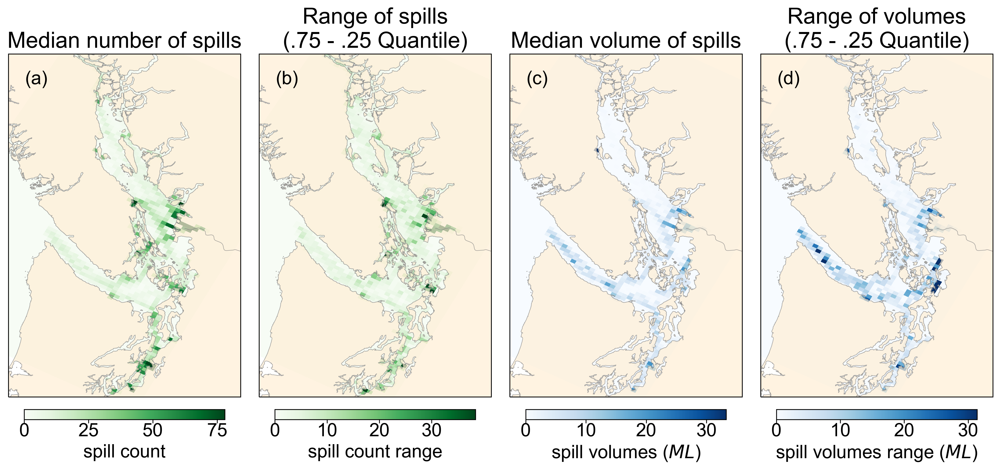

In [34]:
#linewidth for land mask
lw=0.5

# color of shoreline
ec='grey'

fig, axs = plt.subplots(1, 4, 
    figsize=(0.5*35, 0.5*15), #(width, height)
    subplot_kw={'projection': rotated_crs, 
        "facecolor": "white"},
    gridspec_kw={
       'width_ratios': [1,1,1,1],
       'height_ratios': [1],
       'wspace': 0,
       'hspace': 0}
)
for ax in axs:
    ax.add_feature(feature.GSHHSFeature(
        'full', edgecolor=ec, linewidth=lw, facecolor='papayawhip',
         zorder=1, alpha=0.7
    ))
    ax.add_feature(feature.NaturalEarthFeature(
        category='physical', name='rivers_lake_centerlines',
        scale='10m',  edgecolor=ec, linewidth=lw, facecolor='none',
        zorder=1, alpha=0.7
    ))
    ax.set_extent([-124, -123.75, lat.min()-0.15, lat.max()])
    ax.set_aspect(1)

# define data used in plots here so it's easier to see
array_axis0 = count_q['50']
array_axis1 = count_q['range']
array_axis2 = vol_q['50']
array_axis3 = vol_q['range']

# plot data
C_count=axs[0].pcolormesh(X, Y, array_axis0, 
    cmap='Greens',
    vmin=0,
    vmax=0.6*array_axis0.max(),
    zorder=0,
    transform=plain_crs)
C_count_range=axs[1].pcolormesh(X, Y, array_axis1, 
    cmap='Greens',
    vmin=0,
    vmax=0.6*array_axis1.max(),
    zorder=0,
    transform=plain_crs)
C_vol=axs[2].pcolormesh(X, Y, array_axis2, 
    cmap='Blues',
    vmin=0,
    vmax=0.5*array_axis2.max(),
    zorder=0,
    transform=plain_crs)
C_vol_range=axs[3].pcolormesh(X, Y, array_axis3, 
    cmap='Blues',
    vmin=0,
    vmax=0.5*array_axis3.max(),
    zorder=0,
    transform=plain_crs)

axs[0].set_title('Median number of spills');
axs[1].set_title('Range of spills\n(.75 - .25 Quantile)');
axs[2].set_title('Median volume of spills');
axs[3].set_title('Range of volumes\n(.75 - .25 Quantile)');
# Use anchored text to make location of subplot labels consistent between figures
subplot_labels=["(a)", "(b)", "(c)", "(d)"]
for idx,label in enumerate(subplot_labels):
    anchored_txt = AnchoredText(subplot_labels[idx], loc=2,frameon=False)
    axs[idx].add_artist(anchored_txt)
# Add colorbars
cbar0=fig.colorbar(C_count, 
                   ax=axs[0], 
                   pad=0.03, shrink=0.8,
                   location='bottom', 
                   label='spill count',
                   ticks=[0,25,50,75,100]
                  )
cbar1=fig.colorbar(C_count_range, 
                   ax=axs[1], 
                   pad=0.03, shrink=0.8,
                   location='bottom', 
                   label='spill count range',
                   ticks=[0,10,20,30,40])
cbar2=fig.colorbar(C_vol, 
                   ax=axs[2],  
                   pad=0.03, shrink=0.8,
                   location='bottom',
                   label='spill volumes ($ML$)',
                  ticks=[0,1e7,2e7,3e7])
cbar3=fig.colorbar(C_vol_range, 
                   ax=axs[3],  
                   pad=0.03, shrink=0.8,
                   location='bottom',
                   label='spill volumes range ($ML$)',
                   ticks=[0,1e7,2e7,3e7])
cbar0.ax.set_xticklabels([0,25,50,75,100])
cbar1.ax.set_xticklabels([0,10,20,30,40])
cbar2.ax.set_xticklabels([0,10,20,30])
cbar3.ax.set_xticklabels([0,10,20,30])

if custom_dpi>=600:
    plt.savefig(graphics_dir/'SpillCountVolume_MedianRange.png')
else:
    plt.savefig(graphics_dir/'SpillCountVolume_MedianRange_small.png')

In [35]:
print(count_q['50'].max())

130.0


In [36]:
print(count_q['range'].max())

64.0


### Same as above but now showing median values for right two graphics

/tmp/ipykernel_29115/3955345060.py:100: UserWarning: Use the colorbar set_ticks() method instead.
  cbar0.ax.set_xticks(numpy.arange(0,r3_count.max(),25))
/tmp/ipykernel_29115/3955345060.py:105: UserWarning: Use the colorbar set_ticks() method instead.
  cbar1.ax.set_xticks(1e7*numpy.array([0,2,4,6,8]))
/tmp/ipykernel_29115/3955345060.py:106: UserWarning: FixedFormatter should only be used together with FixedLocator
  cbar1.ax.set_xticklabels([0,20,40,60, 80],rotation=0,fontsize=12)
/tmp/ipykernel_29115/3955345060.py:109: UserWarning: Use the colorbar set_ticks() method instead.
  cbar2.ax.set_xticks(numpy.arange(0,count_hist_range.max(),20))
/tmp/ipykernel_29115/3955345060.py:112: UserWarning: Use the colorbar set_ticks() method instead.
  cbar3.ax.set_xticks(numpy.arange(0,vol_hist_range.max(),25))
/tmp/ipykernel_29115/3955345060.py:113: UserWarning: Use the colorbar set_ticks() method instead.
  cbar3.ax.set_xticks(1e7*numpy.array([0,2,4,6,8]))
/tmp/ipykernel_29115/3955345060.py:114

[Text(0.0, 0, '0'), Text(20000000.0, 0, '20'), Text(40000000.0, 0, '40')]

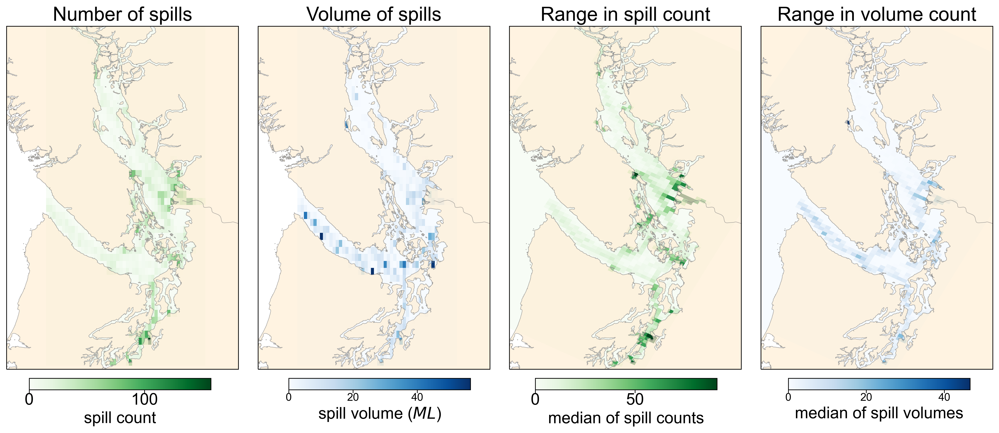

In [37]:
#linewidth for land mask
lw=0.5

# color of shoreline
ec='grey'

fig, axs = plt.subplots(1, 4, 
    figsize=(20, 7), #(width, height)
    subplot_kw={'projection': rotated_crs, 
        "facecolor": "white"},
    gridspec_kw={
       'width_ratios': [1,1,1,1],
       'height_ratios': [1],
       'wspace': 0,
       'hspace': 0}
)
for ax in axs:
    ax.add_feature(feature.GSHHSFeature(
        'full', edgecolor=ec, linewidth=lw, facecolor='papayawhip',
         zorder=1, alpha=0.7
    ))
    ax.add_feature(feature.NaturalEarthFeature(
        category='physical', name='rivers_lake_centerlines',
        scale='10m',  edgecolor=ec, linewidth=lw, facecolor='none',
        zorder=1, alpha=0.7
    ))
    ax.set_extent([-124, -123.75, lat.min()-0.15, lat.max()])
    ax.set_aspect(1)

# do coordinate conversion of (x,y)
xynps = axs[0].projection.transform_points(
    crs.Geodetic(), 
    numpy.array(df[3].spill_lon), 
    numpy.array(df[3].spill_lat))

# ~~~ Number of spills ~~~
# calculate histograms for number of spills and plot using pcolormesh
r3_count,xe,ye = numpy.histogram2d(
    xynps[:,0], 
    xynps[:,1],
    bins=50
);

Yr3,Xr3 = numpy.meshgrid(ye,xe)

# ~~~ Number of spills ~~~
# calculate histograms for number of spills and plot using pcolormesh
r3_count,xe,ye = numpy.histogram2d(
    xynps[:,0], 
    xynps[:,1],
    bins=50
);

# ~~~ Volume of spills ~~~

# calculate histograms for number of spills and plot using pcolormesh
r3_vol,xe,ye = numpy.histogram2d(
    xynps[:,0], 
    xynps[:,1], 
    weights = df[3].spill_volume,
    bins=50
); 

# NOTE: Xr3 and Yr3 are already projected to coordinate system
#      No need to add transform
C_count=axs[0].pcolormesh(Xr3, Yr3, r3_count, 
    cmap='Greens',
    vmin=0,
    vmax=0.7*r3_count.max(),
    zorder=0)
C_vol=axs[1].pcolormesh(Xr3, Yr3, r3_vol, 
    cmap='Blues',
    vmin=0,
    vmax=0.7*r3_vol.max(),
    zorder=0)
C_count_med=axs[2].pcolormesh(X, Y, count_hist_median, 
    cmap='Greens',
    vmin=0,
    vmax=0.7*count_hist_median.max(),
    zorder=0,
    transform=plain_crs)
C_vol_med=axs[3].pcolormesh(X, Y, vol_hist_median,
    cmap='Blues', 
    vmin=0,
    vmax=0.7*vol_hist_median.max(),
    zorder=0, 
    transform=plain_crs)

axs[0].set_title('Number of spills');
axs[1].set_title('Volume of spills');
axs[2].set_title('Range in spill count');
axs[3].set_title('Range in volume count');

cax={}
cax[0] = fig.add_axes([0.15, 0.08, 0.14, 0.025])
cax[1] = fig.add_axes([0.35, 0.08, 0.14, 0.025])
cax[2] = fig.add_axes([0.54, 0.08, 0.14, 0.025])
cax[3] = fig.add_axes([0.735, 0.08, 0.14, 0.025])
cbar0=fig.colorbar(C_count, cax=cax[0], orientation='horizontal', label='spill count')
cbar0.ax.set_xticks(numpy.arange(0,r3_count.max(),25))
#cbar0.ax.set_xticklabels([0,100,200,300,400,500,600],rotation=0,fontsize=12)

cbar1=fig.colorbar(C_vol, cax=cax[1], orientation='horizontal', label='spill volume ($ML$)')
#labels=numpy.arange(0,450,50)
cbar1.ax.set_xticks(1e7*numpy.array([0,2,4,6,8]))
cbar1.ax.set_xticklabels([0,20,40,60, 80],rotation=0,fontsize=12)

cbar2=fig.colorbar(C_count_med, cax=cax[2], orientation='horizontal', label='median of spill counts')
cbar2.ax.set_xticks(numpy.arange(0,count_hist_range.max(),20))

cbar3=fig.colorbar(C_vol_med, cax=cax[3], orientation='horizontal', label='median of spill volumes')
cbar3.ax.set_xticks(numpy.arange(0,vol_hist_range.max(),25))
cbar3.ax.set_xticks(1e7*numpy.array([0,2,4,6,8]))
cbar3.ax.set_xticklabels([0,20,40,60, 80],rotation=0,fontsize=12)